# Sandbox for project

In [2]:
import pandas as pd
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy import ndimage

### Read in preprocessed data

In [2]:
import h5py
f = h5py.File('nyu_depth_v2_labeled.mat', mode='r')
arrays = {}
for k, v in f.items():
    arrays[k] = np.array(v)
    
import json
with open('namesToIds.json') as json_file:
    namesToIds = json.load(json_file)
namesToIds['unlabeled'] = 0

In [3]:
print('.mat file vars: \n')
for key, val in arrays.items():
    print(f'{key}: {val.shape}')

.mat file vars: 

#refs#: (8484,)
#subsystem#: (1,)
accelData: (4, 1449)
depths: (1449, 640, 480)
images: (1449, 3, 640, 480)
instances: (1449, 640, 480)
labels: (1449, 640, 480)
names: (1, 894)
namesToIds: (1, 6)
rawDepthFilenames: (1, 1449)
rawDepths: (1449, 640, 480)
rawRgbFilenames: (1, 1449)
sceneTypes: (1, 1449)
scenes: (1, 1449)


In [4]:
names = [''.join(chr(c) for c in f[ref]) for ref in arrays['names'][0]]

In [5]:
scenes = [''.join(chr(c) for c in f[ref]) for ref in arrays['scenes'][0]]
sceneTypes = [''.join(chr(c) for c in f[ref]) for ref in arrays['sceneTypes'][0]]

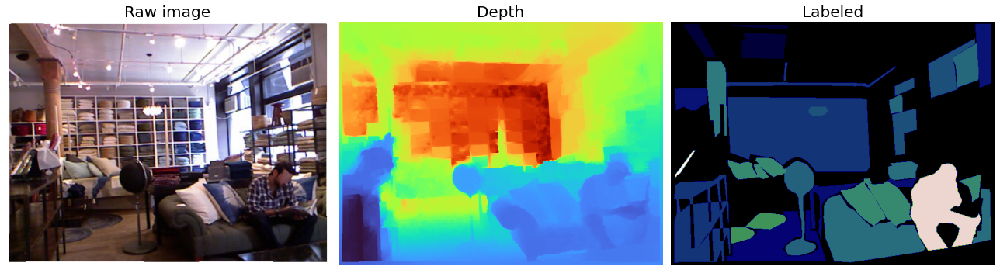

In [6]:
n = 230
fig, axs = plt.subplots(1,3, figsize=(18,6))
img = ndimage.rotate(np.moveaxis(arrays['images'][n], 0, -1), -90)
img2 = np.fliplr(np.moveaxis(arrays['depths'][n], 0, -1))
img3 = np.fliplr(np.moveaxis(arrays['labels'][n], 0, -1))
axs[0].imshow(img)
axs[1].imshow(img2, cmap='turbo')
axs[2].imshow(img3, cmap='gist_earth')
[ax.axis('off') for ax in axs]
axs[0].set_title('Raw image', fontsize=20)
axs[1].set_title('Depth', fontsize=20)
axs[2].set_title('Labeled', fontsize=20)
fig.tight_layout()

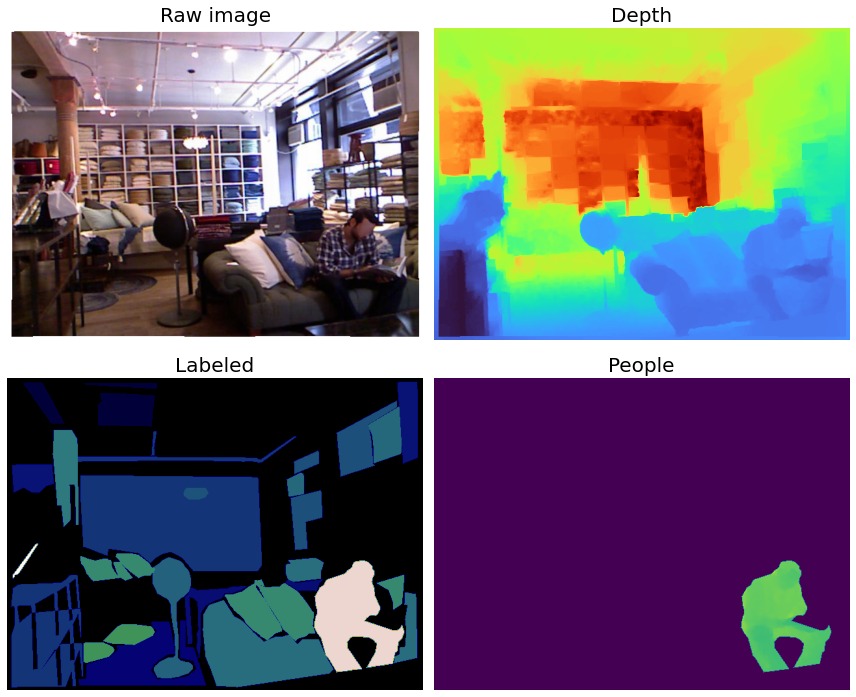

In [7]:
n = 230
fig, axs = plt.subplots(2,2, figsize=(12,10))
img = ndimage.rotate(np.moveaxis(arrays['images'][n], 0, -1), -90)
img2 = np.fliplr(np.moveaxis(arrays['depths'][n], 0, -1))
img3 = np.fliplr(np.moveaxis(arrays['labels'][n], 0, -1))
img4 = (img3 == namesToIds['person']) * img2
axs[0,0].imshow(img)
axs[0,1].imshow(img2, cmap='turbo')
axs[1,0].imshow(img3, cmap='gist_earth')
axs[1,1].imshow(img4)
[axs[i,j].axis('off') for i in range(2) for j in range(2)]
axs[0,0].set_title('Raw image', fontsize=20)
axs[0,1].set_title('Depth', fontsize=20)
axs[1,0].set_title('Labeled', fontsize=20)
axs[1,1].set_title('People', fontsize=20)
fig.tight_layout()

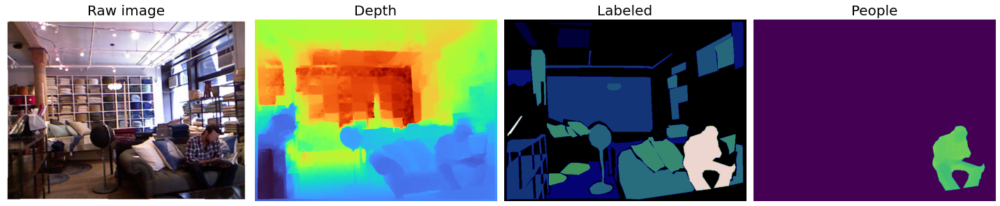

In [8]:
n = 230
fig, axs = plt.subplots(1,4, figsize=(20,6))
img = ndimage.rotate(np.moveaxis(arrays['images'][n], 0, -1), -90)
img2 = np.fliplr(np.moveaxis(arrays['depths'][n], 0, -1))
img3 = np.fliplr(np.moveaxis(arrays['labels'][n], 0, -1))
img4 = (img3 == namesToIds['person']) * img2
axs[0].imshow(img)
axs[1].imshow(img2, cmap='turbo')
axs[2].imshow(img3, cmap='gist_earth')
axs[3].imshow(img4)
[ax.axis('off') for ax in axs]
axs[0].set_title('Raw image', fontsize=20)
axs[1].set_title('Depth', fontsize=20)
axs[2].set_title('Labeled', fontsize=20)
axs[3].set_title('People', fontsize=20)
fig.tight_layout()

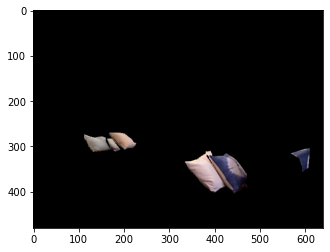

In [44]:
class_img = np.repeat((img3 == namesToIds['pillow'])[:, :, np.newaxis], 3, axis=2) * img
plt.imshow(class_img)

In [9]:
import plotly.express as px


In [18]:
img3

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)

In [12]:
img_filter = img2#(img3 == namesToIds['paper']) * img2
flattened = []
for x in range(img_filter.shape[0]):
    for y in range(img_filter.shape[1]):
        flattened.append([x, y, img2[x,y], 
                          img3[x,y]]) #, '#%02x%02x%02x' % tuple(img[x,y])
flattened = np.asarray(flattened)
flattened = pd.DataFrame(flattened, columns=['y','x','z','label'])#'color'
flattened['label_text'] = flattened.label.map(idsToNames)
flattened = flattened[flattened.z != 0]
flattened = flattened[flattened.index % 4 == 0]


(0.5, 3.0)

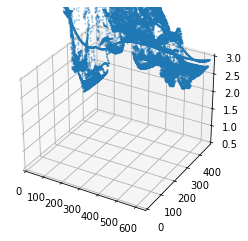

In [13]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')
ax.scatter(flattened['x'], flattened['y'], flattened['z'], s=1, alpha=0.3);
ax.set_xlim(0, 640)
ax.set_ylim(0, 480)
ax.set_zlim(0.5,3)

In [14]:
flattened[flattened.index % 4 == 0]

,y,x,z,label,label_text
0,0.0,0.0,5.603999,0.0,unlabeled
4,0.0,4.0,5.601765,0.0,unlabeled
8,0.0,8.0,5.595576,0.0,unlabeled
12,0.0,12.0,5.586777,0.0,unlabeled
16,0.0,16.0,5.577196,0.0,unlabeled
...,...,...,...,...,...
307180,479.0,620.0,2.873164,0.0,unlabeled
307184,479.0,624.0,2.880592,0.0,unlabeled
307188,479.0,628.0,2.888338,0.0,unlabeled
307192,479.0,632.0,2.896062,0.0,unlabeled


In [11]:
idsToNames = {v: k for k, v in namesToIds.items()}
[(lab, idsToNames[lab]) for lab in np.unique(arrays['labels'][n])]

[(0, 'unlabeled'),
 (1, 'book'),
 (4, 'ceiling'),
 (11, 'floor'),
 (19, 'table'),
 (21, 'wall'),
 (41, 'pipe'),
 (42, 'shelves'),
 (59, 'window'),
 (62, 'light'),
 (74, 'fan'),
 (79, 'air conditioner'),
 (83, 'sofa'),
 (85, 'books'),
 (94, 'column'),
 (119, 'pillow'),
 (143, 'floor mat'),
 (331, 'person'),
 (351, 'gift wrapping')]

In [15]:
import plotly.graph_objects as go
fig = go.Figure(data=[go.Scatter3d(
    x=flattened['x'],
    y=flattened['y'],
    z=flattened['z'],
    text=flattened['label_text'],
    mode='markers',
    marker=dict(
        size=2,
        opacity=0.3,
        color=flattened['label']
    )
)])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()


In [19]:
import cv2

In [21]:
cv2.__version__


'4.3.0'